 <u><h1 style='font-size:45px; text-align:center'><font color = blue>Big</font><font color = orange>Mart </font><font color = grey> Sales</font><br/></h1></u>


# <u>Introduction</u>

     Bigmart is a big supermarket chain, with stores all around the country. One could easily locate Big Mart store in all the major localities, residential areas, high streets, offices, and metro stations.


# <u>Problem Statement</u>

    The data scientists at Big Mart have collected 2013 sales data for 1559 products across 10 stores in different cities. Also, certain attributes of each product and store have been defined. The aim is to make an EDA report to find out the trend of sales of each product at a particular store.

# <u>Hypothesis Generation</u>

   Following are some of the hypotheses based on the problem statement:
   

1.  Sales are biased towards branded items.
1.  Higher sales of low fat items.
1.  Higher sales during end of the year.
1.  Store size affects the sales.
1.  Location of the store affects the sales.
1.  Items with more shelf space sell more.

# <u>Import Libraries</u>

In [1257]:
# linear algebra
import numpy as np 

# data processing
import pandas as pd 

# data visualization
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import style

# <u>Data Acquistion</u>

    Collecting required data.

In [1258]:
#using pandas read_csv to read as csv file as dataframe
df = pd.read_csv("https://raw.githubusercontent.com/Pranjulcr7/Big_Mart_Sales_EDA/master/Big_mart.csv")


# <u>Data Exploration/Analysis</u>
    The aim of this section is to identify any potential issues with the features and decide on how to
    handle those issues. The primary concern is with outliers and unexpected distributions, though we
    might potentially encounter issues such as unexpected scales.
    
##  Data Description

1.  **Item_Identifier :** Unique Product ID

1.  **Item_Weight :** Weight of product

1.   **Item_Fat_Content :** Wether the product is low fat or not

1.   **Item_Visibility :** percentage of total display area in store allocated to this product

1.   **Item_Type :** Category to which product belongs

1.   **Item_MRP :** Maximum Retail Price (list price) of product

1.   **Outlet_Identifier :** Unique Store ID

1.   **Outlet_Establishment_Year :** Year in which store was established

1.   **Outlet_Size :** Size of the store

1.   **Outlet_Location_Type :** Type of city in which the store is located
   
1.   **Outlet_Type :** Grocery store or some sort of supermarket

1.   **Item_Outlet_Sales :** Sales of product in particular store. This is the outcome variable to be predicted.



In [1259]:
#head method to see first five rows of data frame and transposing the returned matrix 
df.head().T

,0,1,2,3,4
Item_Identifier,FDA15,DRC01,FDN15,FDX07,NCD19
Item_Weight,9.3,5.92,17.5,19.2,8.93
Item_Fat_Content,Low Fat,Regular,Low Fat,Regular,Low Fat
Item_Visibility,0.0160473,0.0192782,0.0167601,0,0
Item_Type,Dairy,Soft Drinks,Meat,Fruits and Vegetables,Household
Item_MRP,249.809,48.2692,141.618,182.095,53.8614
Outlet_Identifier,OUT049,OUT018,OUT049,OUT010,OUT013
Outlet_Establishment_Year,1999,2009,1999,1998,1987
Outlet_Size,Medium,Medium,Medium,NaN,High
Outlet_Location_Type,Tier 1,Tier 3,Tier 1,Tier 3,Tier 3


-  On the left are variables of the dataset and on the top are row's index, i.e. 0 to 4.
-  NaN represents null value.

## Dimensions of dataset

    

In [1260]:
df.shape

(8523, 12)

Dataset has 8,523 rows and 12 columns.
    
    
## Basic statistics of dataset

In [1261]:
#using describe method to see description of numeric columns
df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


-  Median of the columns are index 50%, i.e. 50th percintile row.
-  Minimum value of Item_Visibility is 0. This is value is impractical, as item is being sold in store it's visibility cannot be 0.
-  All outlets were established between 1985 and 2009.

## Finding the data quality
    

In [1262]:
#info method to see data frame information
df.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
Item_Identifier              8523 non-null object
Item_Weight                  7060 non-null float64
Item_Fat_Content             8523 non-null object
Item_Visibility              8523 non-null float64
Item_Type                    8523 non-null object
Item_MRP                     8523 non-null float64
Outlet_Identifier            8523 non-null object
Outlet_Establishment_Year    8523 non-null int64
Outlet_Size                  6113 non-null object
Outlet_Location_Type         8523 non-null object
Outlet_Type                  8523 non-null object
Item_Outlet_Sales            8523 non-null float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.1+ KB


-  There are 7 columns with object data type and 5 columns with numeric data type.
-  Item_Weight and Outlet_Size has null values, as there 8523 rows.

### Variables with missing values

In [1263]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

There 1,463 missin values in Item_Weight and 2,410 in Outlet_Size, which will be imputed later.

## Unique values in the categorical variables

In [1264]:
#Using apply method to apply function on dataFrame
# using unique method to get unique values in each variable
df.apply( lambda x: len(x.unique()))

Item_Identifier              1559
Item_Weight                   416
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     4
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64

-  Item_identifier has 1,559 values, that is number of products available in the store.
-  Item_type has 16 values, that is number of types of products available in the store.
-  Outlet_Identifier has 16 values, that is the number of outlets.

# <u>Univariate analysis</u>
    Summary statistics for each field in the data set.
    

## 1. Item_Outlet_Sales ( Target Variable)
    Sales of product in particular store. This is the outcome variable to be predicted.

### Description of Item_Outlet_Sales

In [1265]:
df['Item_Outlet_Sales'].describe(percentiles=[1])

count     8523.000000
mean      2181.288914
std       1706.499616
min         33.290000
50%       1794.331000
100%     13086.964800
max      13086.964800
Name: Item_Outlet_Sales, dtype: float64

-  Variable is of float data type.
-  With range of values from 33.29 to 13,086.96 unit.
-  Mean is 2,181.29 unit.

### Distribution of Item_Outlet_Sales
    Since our target variable is continuous, we can visualise it by plotting its histogram.

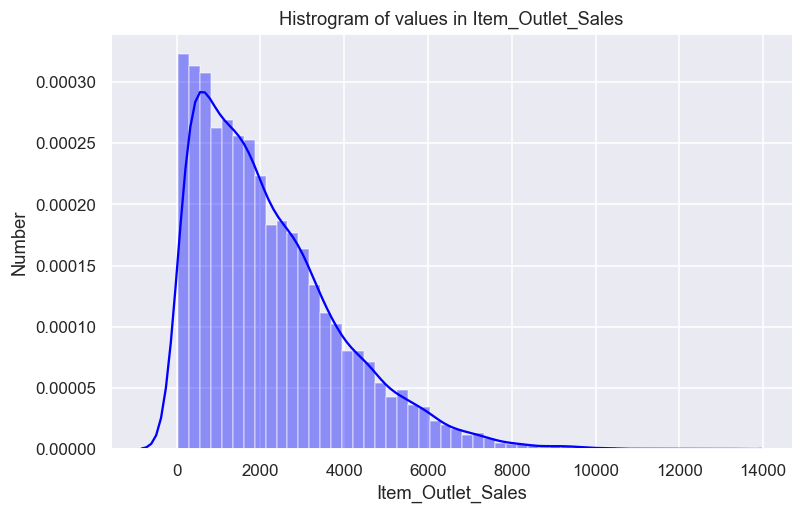

In [1266]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df.Item_Outlet_Sales, color='blue');
plt.ylabel('Number')
plt.xlabel('Item_Outlet_Sales')
plt.title('Histrogram of values in Item_Outlet_Sales');

In [1267]:
print('Skewness = %.4f'%df['Item_Outlet_Sales'].skew())

Skewness = 1.1775


-  The graph is right skewed.
-  It can be infered that the graph has higher concentration on low sales, representing the stores have more number of sales of less amount, like more sale of daily items such as groceries etc. 

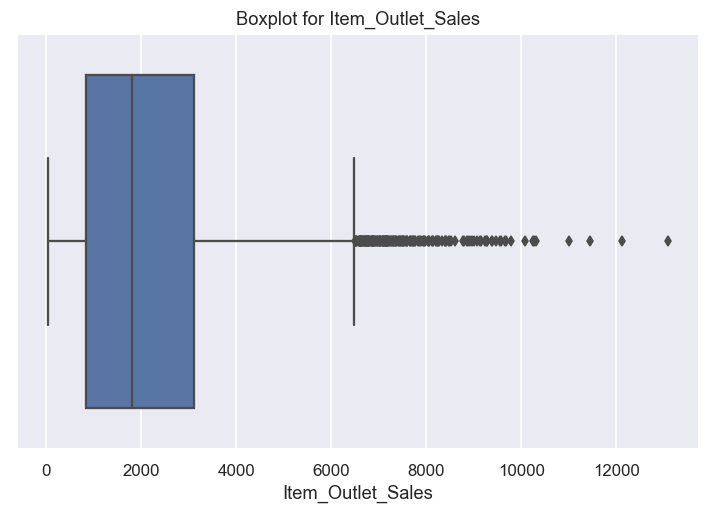

In [1268]:
sns.boxplot(df.Item_Outlet_Sales);
plt.xlabel('Item_Outlet_Sales');
plt.title("Boxplot for Item_Outlet_Sales");

-  Median of the Item_Outlet_Sales is about 1,794.
-  There are many outliers on the right side of the 4th quartile, that tell us that there are very few high sales compared to low sales.

### Item_Outlet_Sales greater than third quartile
    Observing sales for Item_Outlet_Sales greater than 75th percentile.

In [1269]:
#Displaying top 10 rows of dataset sorted by item_outlet_sales
df.sort_values(by='Item_Outlet_Sales', ascending = False)\
.head(10).set_index('Item_Outlet_Sales').T\

Item_Outlet_Sales,13086.9648,12117.56,11445.101999999999,10993.6896,10306.584,10256.649,10236.675,10072.8882,9779.9362,9678.0688
Item_Identifier,NCE42,FDQ19,FDZ20,FDP33,FDI50,FDF39,FDU14,NCH18,NCM05,FDC17
Item_Weight,NaN,NaN,NaN,NaN,NaN,14.85,NaN,NaN,6.825,NaN
Item_Fat_Content,Low Fat,Regular,Low Fat,Low Fat,Regular,Regular,Low Fat,Low Fat,Low Fat,Low Fat
Item_Visibility,0.0105509,0.0142956,0,0.0888399,0.0306933,0.0194951,0.0345844,0.044445,0.059847,0.0153859
Item_Type,Household,Fruits and Vegetables,Fruits and Vegetables,Snack Foods,Canned,Dairy,Dairy,Household,Health and Hygiene,Frozen Foods
Item_MRP,234.996,242.651,253.036,254.267,228.035,261.291,248.375,245.28,262.523,208.993
Outlet_Identifier,OUT027,OUT027,OUT027,OUT027,OUT027,OUT013,OUT027,OUT027,OUT046,OUT027
Outlet_Establishment_Year,1985,1985,1985,1985,1985,1987,1985,1985,1997,1985
Outlet_Size,Medium,Medium,Medium,Medium,Medium,High,Medium,Medium,Small,Medium
Outlet_Location_Type,Tier 3,Tier 3,Tier 3,Tier 3,Tier 3,Tier 3,Tier 3,Tier 3,Tier 1,Tier 3


-  It can be observed that there is more Item_Outlet_Sales for day-to-day products like household, groceries etc. and are mostly from Supermarket Type 3 or Tier 3 outlets.
-  All these items are having almost about same MRP.

## 2.  Item_Identifier 
    This variable is categorical variable and is a Unique Product id. Since branded items are more in demand, we will not drop this variable as it can be used to distinguish between product brands.
   

### Description of Item_Identifier 

In [1270]:
df['Item_Identifier'].describe()

count      8523
unique     1559
top       FDW13
freq         10
Name: Item_Identifier, dtype: object

-  Variable is of object type
-  There are 1,559 unique products all over the stores.
-  Mode is 10 for product FDW13.

### Unique Item_Identifier Count

In [1271]:
df.Item_Identifier.value_counts().head()

FDW13    10
FDG33    10
FDX20     9
FDF56     9
NCY18     9
Name: Item_Identifier, dtype: int64

In [1272]:
# Printing details of top two items with highest frequencies
print(df.loc[(df.Item_Identifier == 'FDW13'), ['Item_Identifier','Item_Fat_Content'\
    ,'Item_Type','Item_MRP']].set_index('Item_Identifier').head(1))\

print(df.loc[(df.Item_Identifier == 'FDG33'), ['Item_Identifier','Item_Fat_Content'\
    ,'Item_Type','Item_MRP']].set_index('Item_Identifier').head(1))\

                Item_Fat_Content Item_Type  Item_MRP
Item_Identifier                                     
FDW13                    Low Fat    Canned   51.1324
                Item_Fat_Content Item_Type  Item_MRP
Item_Identifier                                     
FDG33                    Regular   Seafood  170.4764


Items which are more in demand are Low-Fat canned items and Regular seafood items.

## 3.  Item_Weight 
    This variable is independent numeric variable which represents the weight of the product.
   

### Description of Item_Weight

In [1273]:
df['Item_Weight'].describe()

count    7060.000000
mean       12.857645
std         4.643456
min         4.555000
25%         8.773750
50%        12.600000
75%        16.850000
max        21.350000
Name: Item_Weight, dtype: float64

-  Variable is of float data type.
-  With range of values from 4.55 to 21.35
-  Count of variable is 7,060. It can be inferred that there are null values present.

### Distribution of Item_Weight
    Since our target variable is continuous, we can visualise it by plotting its histogram.

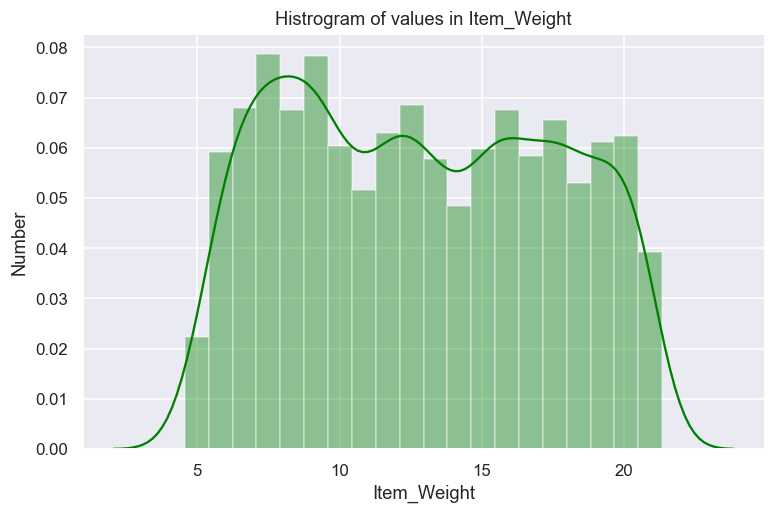

In [1274]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df.Item_Weight[df.Item_Weight.notnull()], color='green');
plt.ylabel('Number')
plt.xlabel('Item_Weight')
plt.title('Histrogram of values in Item_Weight');

In [1275]:
print('Skewness = %.4f'%df['Item_Weight'].skew())

Skewness = 0.0824


- There is no clear pattern in Item_Weight.
- Stores seems to have equal number of items of same weight approx.

### Imputing missing values

#### Sum of missing values

In [1276]:
print(' There are %d missing values in Item_Weight column.'
      %df['Item_Weight'].isnull().sum())

 There are 1463 missing values in Item_Weight column.


#### Type of items having null for weight

In [1277]:
df.loc[df.Item_Weight.isnull(),'Item_Type'].value_counts()

Fruits and Vegetables    213
Snack Foods              212
Household                151
Frozen Foods             138
Dairy                    116
Baking Goods             112
Canned                   110
Health and Hygiene        90
Meat                      88
Soft Drinks               71
Breads                    47
Others                    32
Hard Drinks               31
Breakfast                 21
Starchy Foods             18
Seafood                   13
Name: Item_Type, dtype: int64

- kind of make sense, fruits and vegetables and other open sold have their weight as null because unlike packed food, their weights vary almost for every sale.


#### Mean of each item identifier

finding mean of items with same identifier to fill null values of items having null weight.

In [1278]:
# creating a dictionary of item_id and their mean weights
list_unique_items = df.Item_Identifier.unique()
mean_items = { i:df.loc[df.Item_Identifier==i,['Item_Weight']].mean() for i in list_unique_items}

Getting mean of weight of each item type and imputing in missing value for that particular item type to get more accurate mode.



#### Fill mean of Item_Weight of each Item_type inplace of missing values

In [1279]:
# df['Item_Weight'] = df['Item_Weight'].fillna(0);
for i, m in mean_items.items():
    df.loc[df['Item_Identifier']==i,['Item_Weight']] = df.loc[df['Item_Identifier']==i,['Item_Weight']].fillna(m);

### Distribution of Item_Weight after imputing missing values
    Visualise it by plotting its histogram.

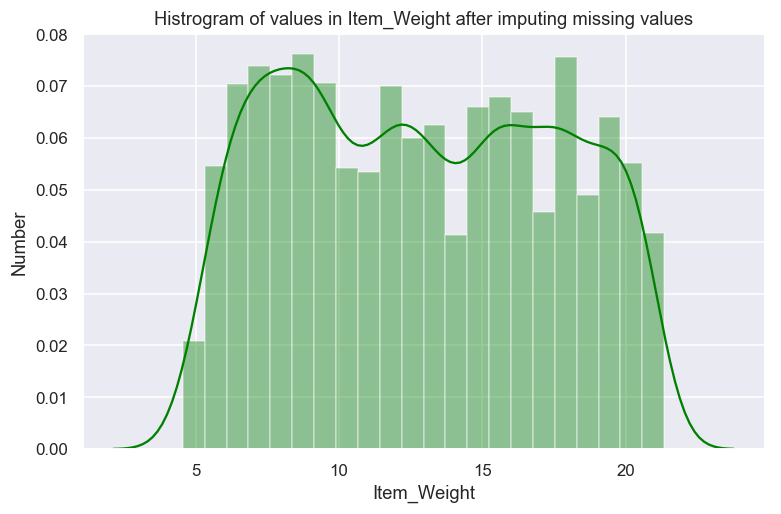

In [1280]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df.Item_Weight[df.Item_Weight.notnull()], color='green');
plt.ylabel('Number')
plt.xlabel('Item_Weight')
plt.title('Histrogram of values in Item_Weight after imputing missing values');

Still no clear pattern, plot seems evenly distributed.

## 4.  Item_Fat_Content 
    This variable is categorical variable and tells us wether the product is low fat or not.
   

### Description of Item_Fat_Content 

In [1281]:
df['Item_Fat_Content'].describe()

count        8523
unique          5
top       Low Fat
freq         5089
Name: Item_Fat_Content, dtype: object

-  Variable is of object type
-  It can be noticed that there are 5 unique value for two categories that is low fat or not, that need to be fixed.

### Unique Item_Fat_Content Count

In [1282]:
df['Item_Fat_Content'].value_counts()

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

It is infere that there are 5 unique value for two categories that is low fat and regular.

#### Data cleaning
    We will replace string 'lf' and 'low fat' with 'Low Fat', and string 'reg' with 'Regular'.

In [1283]:
df['Item_Fat_Content'] = df['Item_Fat_Content'].replace({'Low Fat':'Low_Fat','LF':'Low_Fat','low fat':'Low_Fat','reg':'Regular'})

### Distribution of Item_Fat_Content
    Since our variable is categorical, we can visualise it by plotting a countplot.

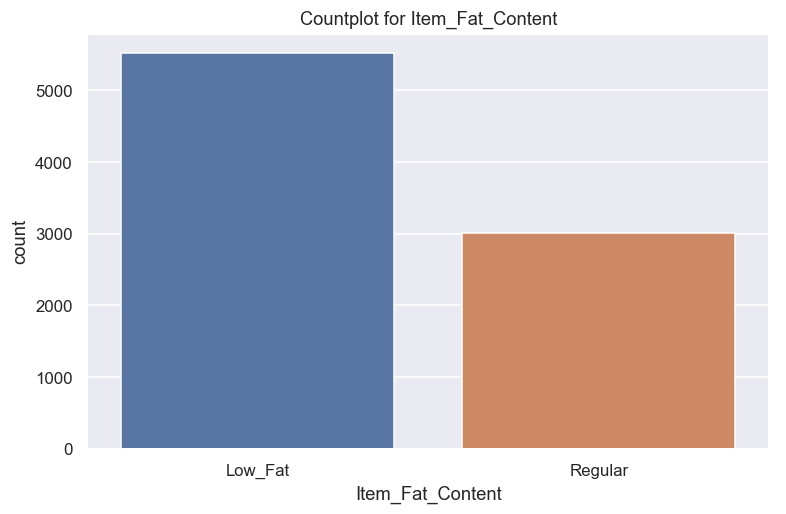

In [1284]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df.Item_Fat_Content);
plt.title("Countplot for Item_Fat_Content");

It can be induced that Low Fat items are more in demand than regular fat items.

## 5.  Item_Visibility
    This variable is independent numeric variable which represents percentage of total display area in store allocated to the product.
   

### Description of Item_Visibility

In [1285]:
df['Item_Visibility'].describe()

count    8523.000000
mean        0.066132
std         0.051598
min         0.000000
25%         0.026989
50%         0.053931
75%         0.094585
max         0.328391
Name: Item_Visibility, dtype: float64

-  Variable is of float data type.
-  With range of values from 0 to 0.3284
-  The minimum value is 0, which means item is not visible at all, this is impractical.

In [1286]:
#using value_counts to get count of all unique value and printing the first row
#to see count for 0 visibility
df['Item_Visibility'].value_counts().head(1)

0.0    526
Name: Item_Visibility, dtype: int64

There are 526 items which have 0 visibility according to the data, this need to be fixed cause it's impractical. 

### Distribution of Item_Visibility
    Since our target variable is continuous, we can visualise it by plotting its histogram.

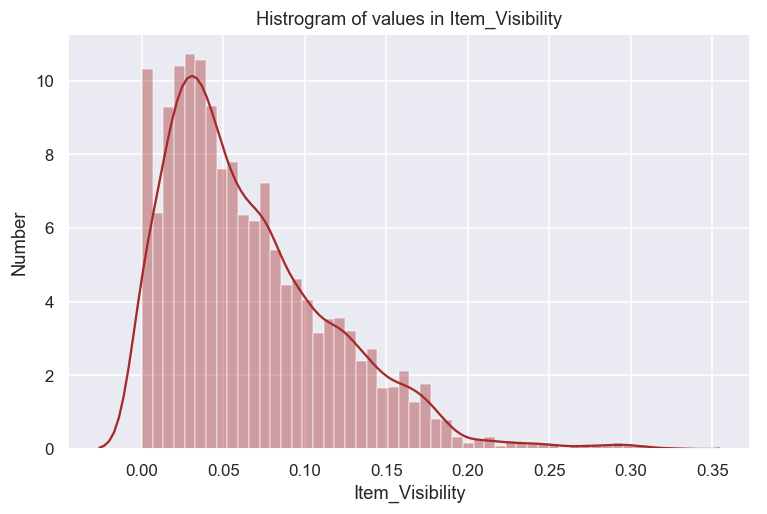

In [1287]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df['Item_Visibility'], color='brown');
plt.ylabel('Number')
plt.xlabel('Item_Visibility')
plt.title('Histrogram of values in Item_Visibility');

In [1288]:
print('Skewness = %.4f'%df['Item_Visibility'].skew())

Skewness = 1.1671


-  The graph is right skewed.
-  It can be infered that the stores has more items with less visibility. Which is relevant as all items can't have high visibilty.

### Replacing 0’s in Item_Visibility variable


#### Mean of Item_Visibility for each Item_Identifier

In [1289]:
#Determine average visibility of a product
visibility_avg = df.pivot_table(values='Item_Visibility', index='Item_Identifier')
visibility_avg.head()

,Item_Visibility
Item_Identifier,
DRA12,0.031956
DRA24,0.048062
DRA59,0.134718
DRB01,0.082126
DRB13,0.008002


Getting mean of visibility of each Item_Identifier and replacing with 0's in Item_Visibility.



#### Fill mean of Item_Visibility of each Item_Identifier inplace of 0

In [1290]:
#Impute 0 values with mean visibility of that similar product:
miss_bool = (df['Item_Visibility'] == 0)

print ('Number of 0 values initially: %d' %sum(miss_bool))
df.loc[miss_bool,'Item_Visibility'] = df.loc[miss_bool,'Item_Identifier'].apply(lambda x: visibility_avg.loc[x])
print ('Number of 0 values after modification: %d' %sum(df['Item_Visibility'] == 0))

Number of 0 values initially: 526
Number of 0 values after modification: 0


### Distribution of Item_Visibility after Replacing 0’s in Item_Visibility 

    Since our target variable is continuous, we can visualise it by plotting its histogram.

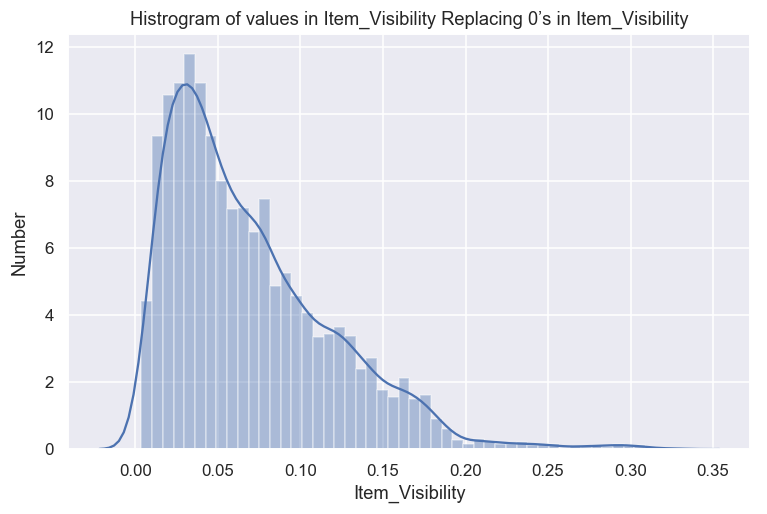

In [1291]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df['Item_Visibility']);
plt.ylabel('Number')
plt.xlabel('Item_Visibility')
plt.title('Histrogram of values in Item_Visibility Replacing 0’s in Item_Visibility');

In [1292]:
print('Skewness = %.4f'%df['Item_Visibility'].skew())

Skewness = 1.2333


-  The graph is still right skewed.
-  It can be noticed that the zero's bin has been removed.

## 6.  Item_Type 
    This variable is categorical variable and tells about the type of the product.
   

### Description of Item_Type

In [1293]:
df['Item_Type'].describe()

count                      8523
unique                       16
top       Fruits and Vegetables
freq                       1232
Name: Item_Type, dtype: object

-  Variable is of object type
-  It can be noticed that there are 16 unique types of items.

### Unique Item_Type Count
    percentage of sales of each item type.

In [1294]:
df['Item_Type'].value_counts()/(df["Item_Type"].value_counts().sum()/100)

Fruits and Vegetables    14.455004
Snack Foods              14.079549
Household                10.676992
Frozen Foods             10.043412
Dairy                     8.001877
Canned                    7.614690
Baking Goods              7.602957
Health and Hygiene        6.101138
Soft Drinks               5.221166
Meat                      4.986507
Breads                    2.944972
Hard Drinks               2.510853
Others                    1.982870
Starchy Foods             1.736478
Breakfast                 1.290625
Seafood                   0.750909
Name: Item_Type, dtype: float64

- Fruits and Vegetables, Snack Foods etc. have much more sales count that is above 14% approx.
- It can be infered that item type such as Fruits and vegetables and Snack foods are more in demand, which make sense.

### Distribution of Item_Type
    Since our variable is categorical, we can visualise it by plotting a countplot.

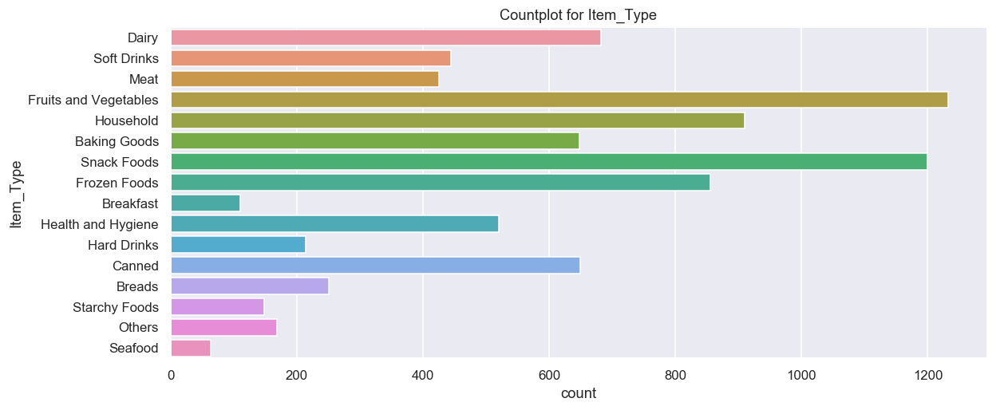

In [1295]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(12,5), 'figure.dpi':110})
sns.countplot(y=df.Item_Type);
plt.title("Countplot for Item_Type");

It can be noticed that Fruits and Vegetables are more in count, followed by Snack Foods and others.

## 7.  Item_MRP
    This variable is independent numeric variable which represents the market price of the item.

### Description of Item_MRP

In [1296]:
df['Item_MRP'].describe()

count    8523.000000
mean      140.992782
std        62.275067
min        31.290000
25%        93.826500
50%       143.012800
75%       185.643700
max       266.888400
Name: Item_MRP, dtype: float64

-  Variable is of float data type.
-  With range of values from 31.3 unit to 266.9 unit.

### Distribution of Item_MRP
    Since our target variable is continuous, we can visualise it by plotting its histogram.

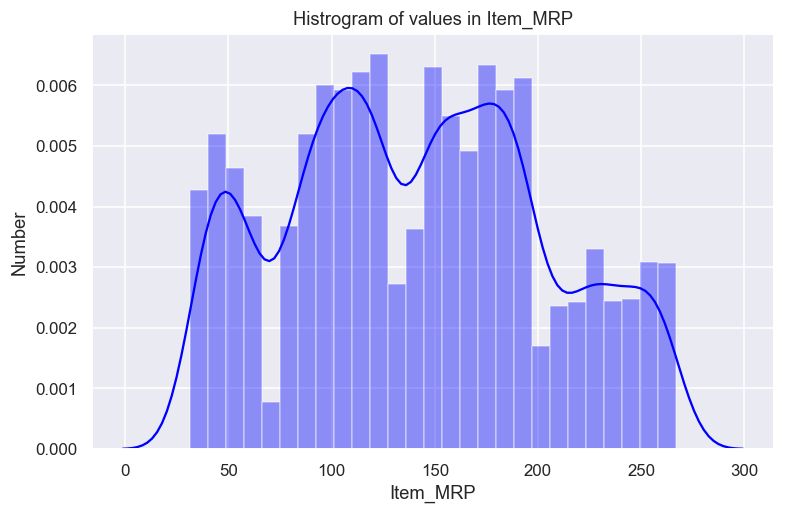

In [1297]:
#Using seaborn distplot to plot histrogram excluding missing values
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.distplot(df['Item_MRP'], color='blue');
plt.ylabel('Number')
plt.xlabel('Item_MRP')
plt.title('Histrogram of values in Item_MRP');

In [1298]:
print('Skewness = %.4f'%df['Item_MRP'].skew())

Skewness = 0.1272


-  There is no clear pattern in Item_MRP.
-  Items with prices which lie in range from about 100 to 200 have more sales comparetively.

## 8.  Outlet_Identifier 
    This variable is categorical variable and is a Unique Outlet id. Since we need to predict Item_Outlet_Sales we should keep this variable.
   

### Description of Outlet_Identifier 

In [1299]:
df['Outlet_Identifier'].describe()

count       8523
unique        10
top       OUT027
freq         935
Name: Outlet_Identifier, dtype: object

-  Variable is of object type
-  There are 10 Outlets in total.

### Distribution of Outlet_Identifier
    Since our variable is categorical, we can visualise it by plotting a countplot.

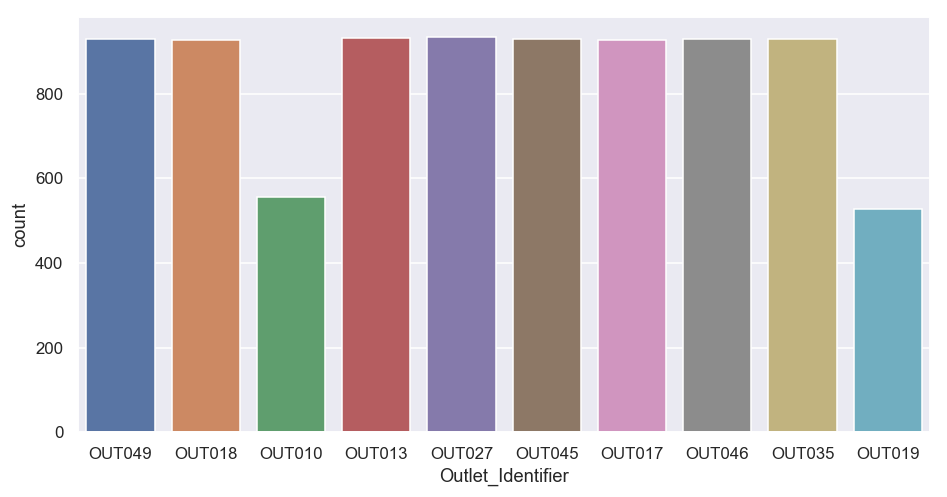

In [1300]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(10,5), 'figure.dpi':110})
sns.countplot(df['Outlet_Identifier']);

### Unique Outlet_Identifier Count

In [1301]:
df.Outlet_Identifier.value_counts()

OUT027    935
OUT013    932
OUT046    930
OUT035    930
OUT049    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

- It can be observed that Outlet 'OUT019' and 'OUT010' have less sale.
- While others have equal sales.

## 9.  Outlet_Establishment_Year
    This variable is categorical variable and tells the year when the Outlet was established.
   

### Description of Outlet_Establishment_Year 

In [1302]:
df['Outlet_Establishment_Year'].describe()

count    8523.000000
mean     1997.831867
std         8.371760
min      1985.000000
25%      1987.000000
50%      1999.000000
75%      2004.000000
max      2009.000000
Name: Outlet_Establishment_Year, dtype: float64

All the Outlet were Established between 1985 and 2009.

### Distribution of Outlet_Establishment_Year
    Since our variable is categorical, we can visualise it by plotting a countplot.

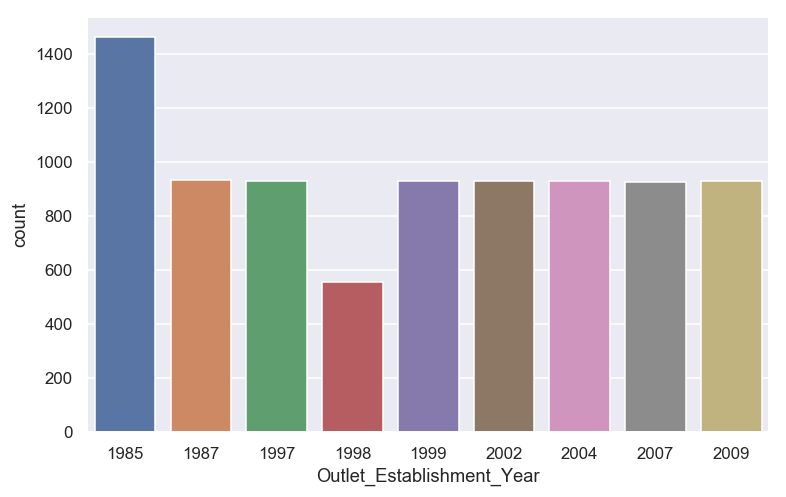

In [1303]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df.Outlet_Establishment_Year);

It can infered that 1,463 outlets were established in 1985.

## 10.  Outlet_Size 
    This variable is categorical variable and tells us about the size of the Outlet. We will keep this variable as bigger outlets have more item types, hence more sales practically.
   

### Description of Outlet_Size 

In [1304]:
df['Outlet_Size'].describe()

count       6113
unique         3
top       Medium
freq        2793
Name: Outlet_Size, dtype: object

-  Variable is of object type
-  It can be noticed that there are 3 unique values.
-  Variable has 6,113 columns that indicates about the missing values.

In [1305]:
outlet_size_na = df.loc[df['Outlet_Size'].isnull(),['Outlet_Identifier','Outlet_Size']]
outlet_size_na['Outlet_Identifier'].value_counts()

OUT045    929
OUT017    926
OUT010    555
Name: Outlet_Identifier, dtype: int64

-  These outlets have their outlet size missing.


#### Filling null Outlet_Size by Unknown

In [1306]:
df['Outlet_Size'] = df['Outlet_Size'].fillna('Unknown')

### Distribution of Outlet_Size
    Since our variable is categorical, we can visualise it by plotting a countplot.

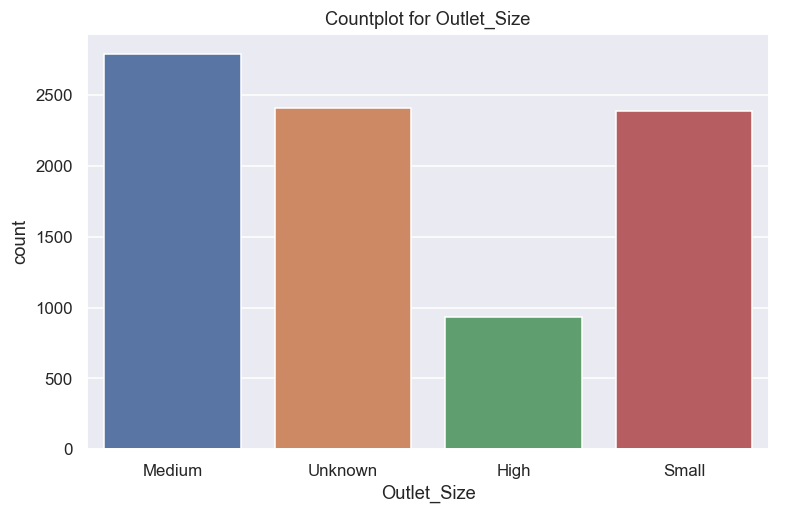

In [1307]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df['Outlet_Size']);
plt.title("Countplot for Outlet_Size");

It can be induced that there are more outlets of medium size.

## 11.  Outlet_Location_Type 
    This variable is categorical variable and tells us about the type of city in which the store is located.
   

### Description of Outlet_Location_Type 

In [1308]:
df['Outlet_Location_Type'].describe()

count       8523
unique         3
top       Tier 3
freq        3350
Name: Outlet_Location_Type, dtype: object

-  Variable is of object type
-  It can be noticed that there are 3 unique values.

### Distribution of Outlet_Location_Type
    Since our variable is categorical, we can visualise it by plotting a countplot.

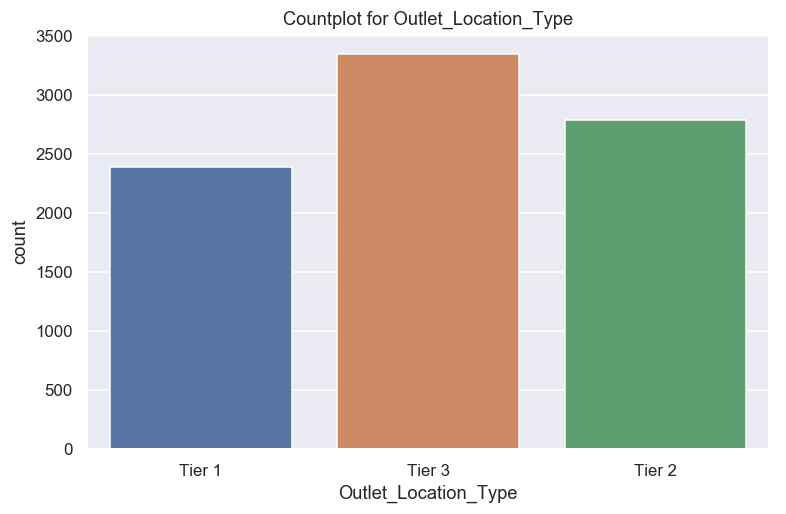

In [1309]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df['Outlet_Location_Type']);
plt.title("Countplot for Outlet_Location_Type");

There are more outlets in Tier 3 city compared to others.

## 12.  Outlet_Type 
    This variable is categorical variable and tells the outlet is a grocery store or some sort of supermarket.
   

### Description of Outlet_Type 

In [1310]:
df['Outlet_Type'].describe()

count                  8523
unique                    4
top       Supermarket Type1
freq                   5577
Name: Outlet_Type, dtype: object

-  Variable is of object type
-  It can be noticed that there are 4 unique values.

### Distribution of Outlet_Type
    Since our variable is categorical, we can visualise it by plotting a countplot.

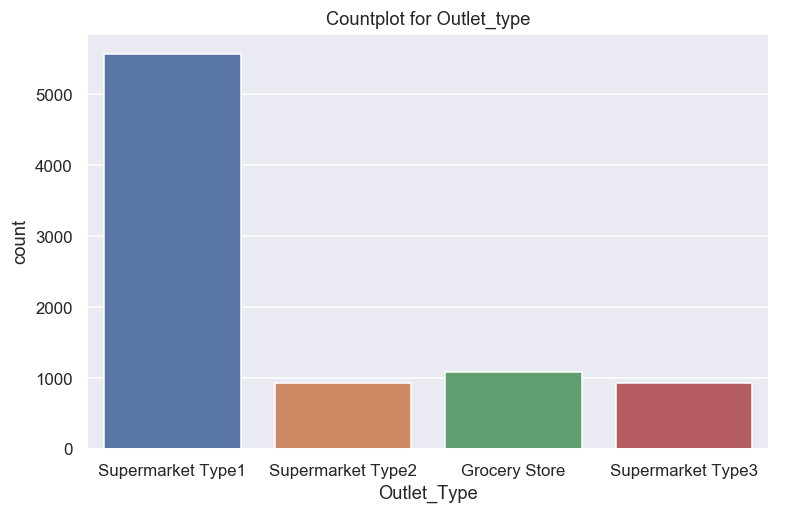

In [1311]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df['Outlet_Type']);
plt.title("Countplot for Outlet_type");

There are mostly outlet types of Supermarket Type 1 .

## 12. Outlet_Age ( Derived attribute)
    Age of the outlet is the difference between established year and 2019 (current year).

In [1312]:
# Current year that is 2019 subtracting by year eestablished to get present age
import datetime
now = datetime.datetime.now()
df['Outlet_Age'] = now.year - df['Outlet_Establishment_Year']

### Description of Outlet_Age 

In [1313]:
df['Outlet_Age'].describe()

count    8523.000000
mean       21.168133
std         8.371760
min        10.000000
25%        15.000000
50%        20.000000
75%        32.000000
max        34.000000
Name: Outlet_Age, dtype: float64

-  Variable is of float type
-  IRange of Outlet_Age is from 10 to 34 years.

### Distribution of Outlet_Age
    Since our variable is categorical, we can visualise it by plotting a countplot.

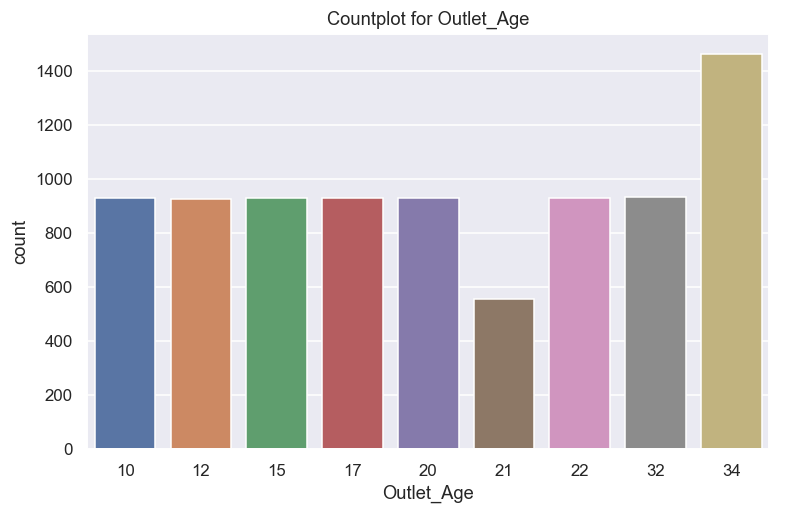

In [1314]:
#Using seaborn countplot to plot
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':110})
sns.countplot(df['Outlet_Age']);
plt.title("Countplot for Outlet_Age");

There are more outlets which are 34 years old.

### Dropping Outlet_Establishment_Year attribute

In [1315]:
df = df.drop(['Outlet_Establishment_Year'], axis=1)

- we have derived variable Outlet_Age from Outlet_Establishment_Year.


# <u>Bivariate analysis</u>
        Bivariate analysis involves the analysis of two variables, for the purpose of determining the empirical 
        relationship between them.
    

## Corelation plot

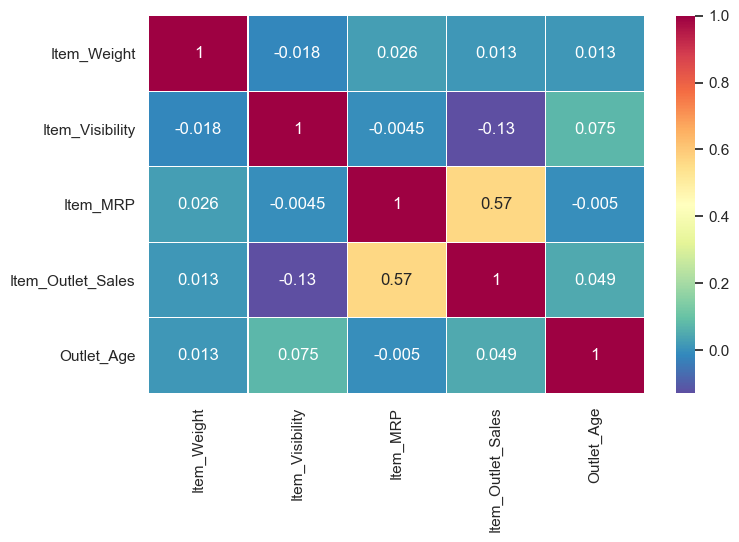

In [1316]:
#Using seaborn set to plot heatmap
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
cr = df.corr()
with sns.axes_style("whitegrid"):
    sns.heatmap( cr, cmap='Spectral_r', annot=True, square=False, linewidth=.1);

 Above table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used as a way to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses.


-  Variables with strongest effects on Item_Outlet_Sales are :

  1. Item_MRP ( 0.57)
  2. Outlet_Age ( 0.049)


-  Variables with highest correlation coeffecients are :

  1. Outlet_Age and Item_Visibility ( 0.075)
  2. Item_MRP and Item_Weight ( 0.026)




 ## Pairplots
 Plot pairwise relationships of non-categorical variables in a dataset.

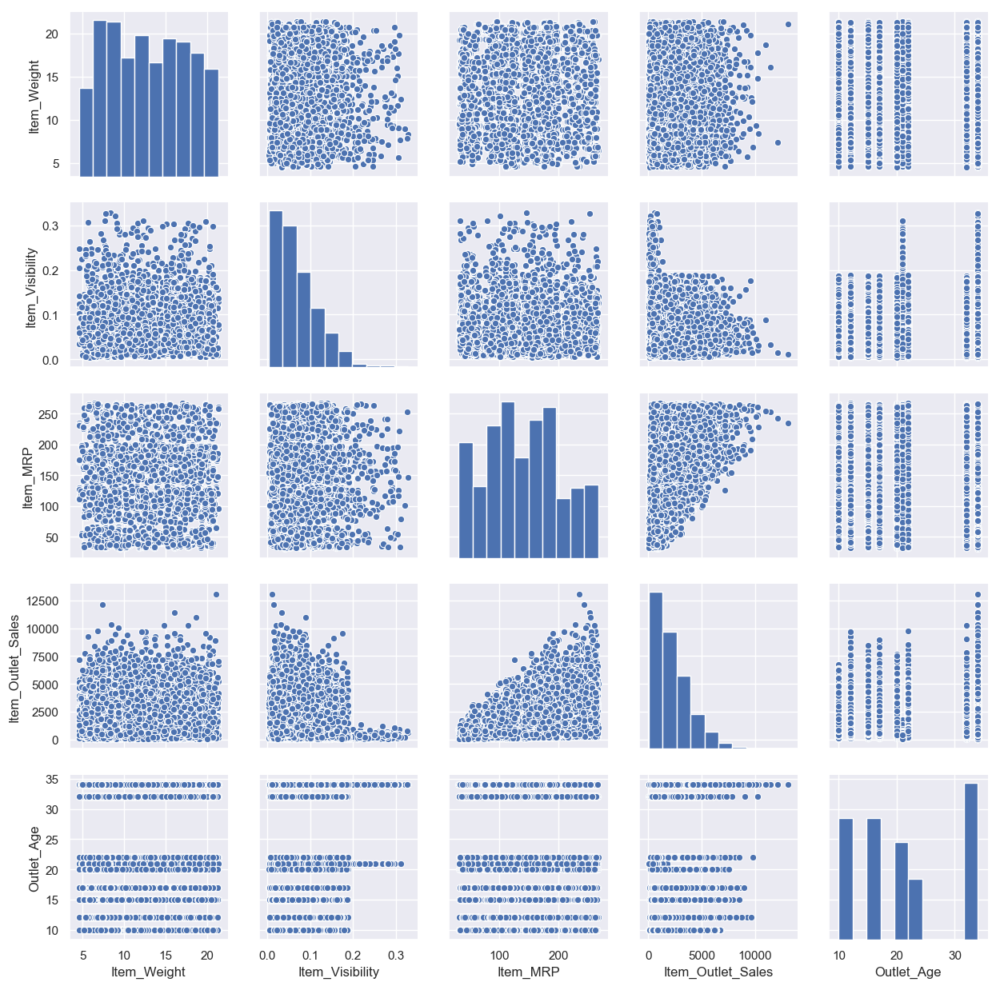

In [1317]:
sns.pairplot(df);
np.warnings.filterwarnings('ignore')

## 1. Item_Outlet_Sales vs Item_MRP
    Relation between sales of product in particular store and maximum Retail Price (list price) of product.

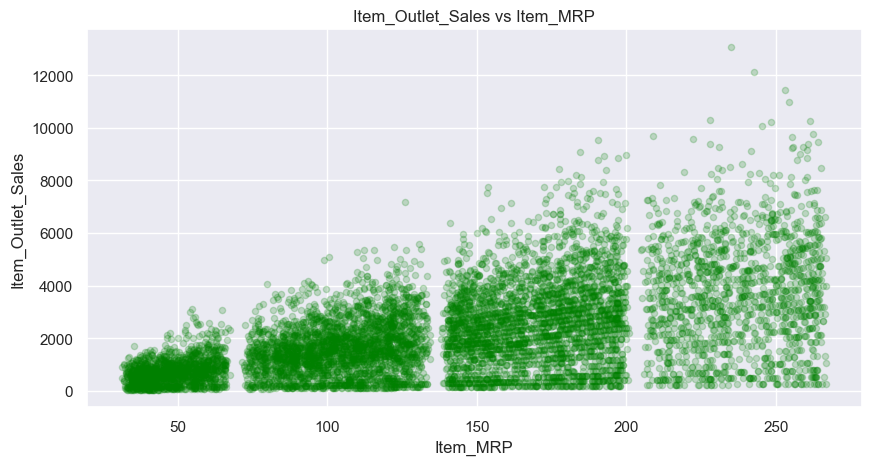

In [1318]:
sns.set(rc={'figure.figsize':(10,5), 'figure.dpi':100})
df.plot.scatter(y='Item_Outlet_Sales', x='Item_MRP', alpha=0.2, c='green');
plt.title('Item_Outlet_Sales vs Item_MRP');

-  There are more items with less MRP and less amount of sales.
-  Few outliers with high MRP and high sales.
- It can be concluded that Item_MRP is directly proportional to Item_Outlet_Sales, which make sense as low price items sales have weak correlation than high priced items.
-  we can clearly see 4 segments of prices.

## 2. Item_Outlet_Sales vs Outlet_Age
    Relation between sales of product in particular store and age of the outlet.

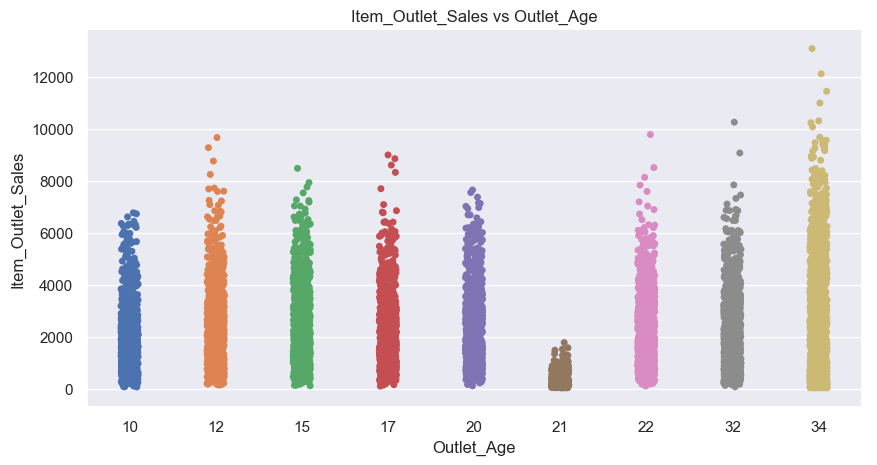

In [1319]:
sns.stripplot(y='Item_Outlet_Sales', x='Outlet_Age', data=df);
plt.title('Item_Outlet_Sales vs Outlet_Age');

It can be infered that the outlets with age 21 have less sales.

## 3. Item_Outlet_Sales vs Item_Weight
    Relation between sales of product in particular store and Weight of product.

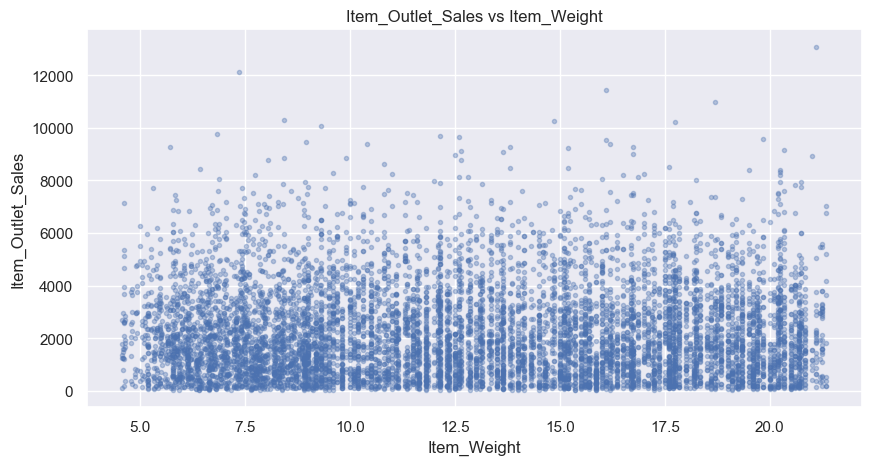

In [1320]:
plt.plot(df['Item_Weight'], df['Item_Outlet_Sales'],'.', alpha=0.35);
plt.xlabel("Item_Weight")
plt.ylabel("Item_Outlet_Sales")
plt.title('Item_Outlet_Sales vs Item_Weight');

- Item_Outlet_Sales is spread well across the entire range of the Item_Weight without any obvious pattern.
- Making alot of sense, practically there is no correlation between Item_Weight and Item_Outlet_Sales, such as Fruits and vegetables of more compared to a mobile device.

## 4. Item_Outlet_Sales vs Item_Visibility
    Relation between sales of product in particular store and visibility of product.

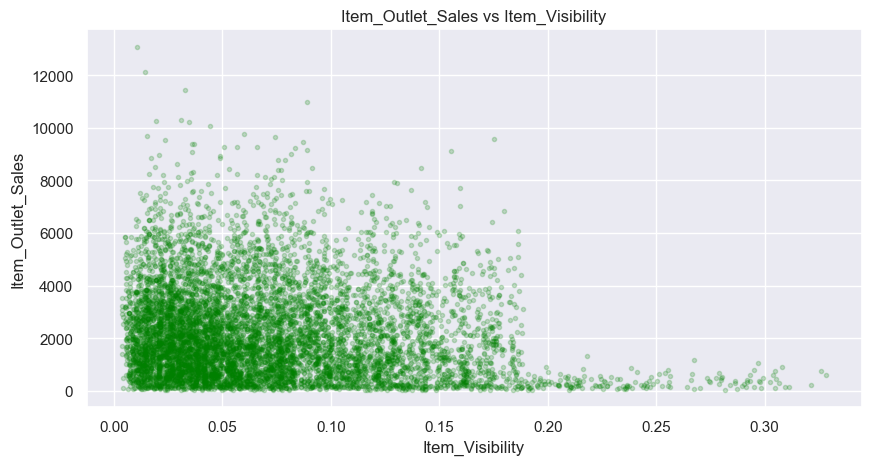

In [1321]:
plt.plot(df['Item_Visibility'], df['Item_Outlet_Sales'],'.', color='green', alpha=0.2);
plt.xlabel("Item_Visibility")
plt.ylabel("Item_Outlet_Sales")
plt.title('Item_Outlet_Sales vs Item_Visibility');

- It can be infered that the items with less visibilty have more concentration of sales, which tells us that customer come with their mind make up what to buy, visibility doesn't make change in sales.
-  And shows somewhat the weak negative correlation between both found above.

## 5. Item_MRP vs Item_Weight
    Relation between maximum Retail Price (list price) of product and Weight of product.

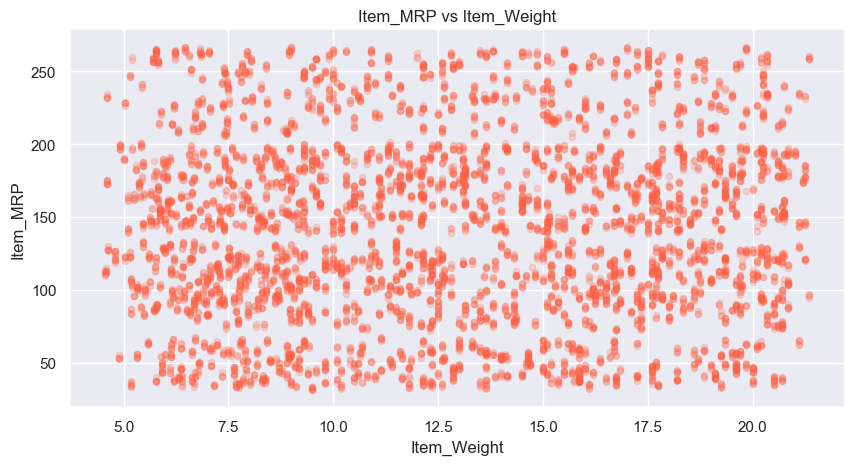

In [1322]:
df.plot.scatter(y='Item_MRP', x='Item_Weight', alpha=0.2, c='tomato');
plt.title('Item_MRP vs Item_Weight');

No clear pattern.

## 6. Item_Outlet_Sales vs Item_Type
    Relation between sales of product in particular store and Category to which product belongs.

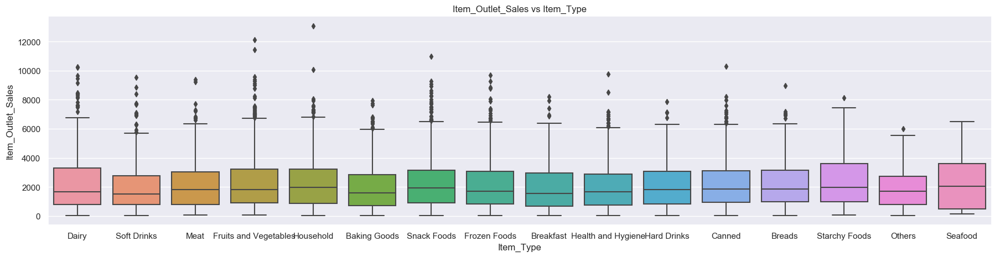

In [1323]:
sns.set(rc={'figure.figsize':(22,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Item_Type', data=df);
plt.title('Item_Outlet_Sales vs Item_Type');

Distribution of Item_Outlet_Sales across the categories of Item_Type is not very distinct.

## 7. Item_Outlet_Sales vs Item_Fat_Content
    Relation between sales of product in particular store and Wether the product is low fat or not.

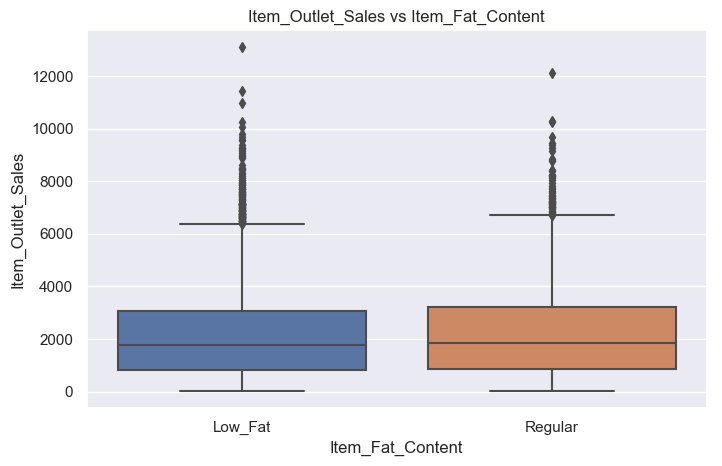

In [1324]:
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Item_Fat_Content', data=df);
plt.title('Item_Outlet_Sales vs Item_Fat_Content');

Distribution of Item_Outlet_Sales across the categories of Item_Fat_Content is not very distinct.

## 8. Item_Outlet_Sales vs Outlet_Type
    Relation between sales of product in particular store and Grocery store or some sort of supermarket.

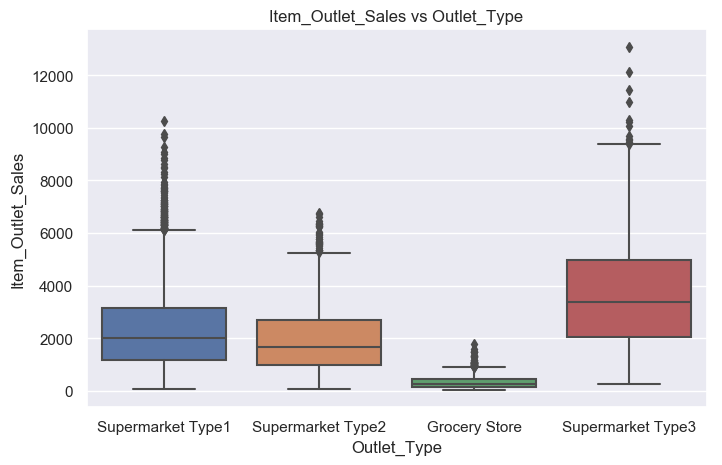

In [1325]:
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Outlet_Type', data=df);
plt.title('Item_Outlet_Sales vs Outlet_Type');

-  Grocery Store has most of its data points around the lower sales values as compared to the other categories.
-  Supermarket Type3 has better sales compared to other categories.

## 9. Item_Outlet_Sales vs Outlet_Location_Type
    Relation between sales of product in particular store and Type of city in which the store is located.

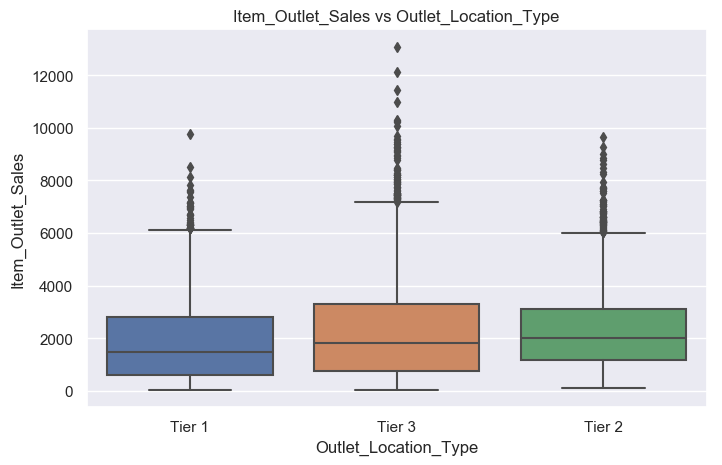

In [1326]:
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Outlet_Location_Type', data=df);
plt.title('Item_Outlet_Sales vs Outlet_Location_Type');

Distribution of Item_Outlet_Sales across the categories of Outlet_Location_Type is not very distinct.

## 10. Item_Outlet_Sales vs Outlet_Identifier 
    Relation between sales of product in particular store and Unique Store ID.

In [1327]:
pivot_sales = df.pivot_table(values='Item_Outlet_Sales', index='Outlet_Identifier')
pivot_sales

,Item_Outlet_Sales
Outlet_Identifier,
OUT010,339.351662
OUT013,2298.995256
OUT017,2340.675263
OUT018,1995.498739
OUT019,340.329723
OUT027,3694.038558
OUT035,2438.841866
OUT045,2192.384798
OUT046,2277.844267


Outlet_Identifier : Average of Item_Outlet_Sales.

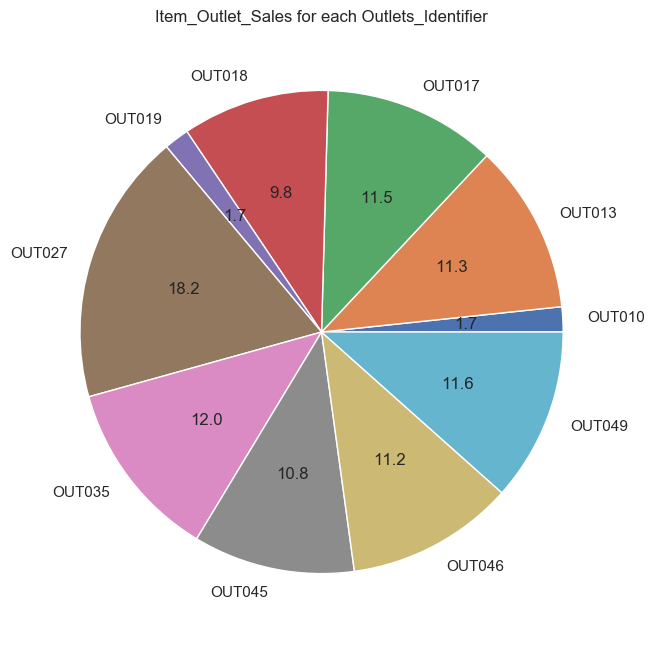

In [1328]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(aspect="equal"))
ax.pie( labels=pivot_sales.index, x=pivot_sales.Item_Outlet_Sales ,autopct='%.1f')
ax.set_title("Item_Outlet_Sales for each Outlets_Identifier")
plt.show()

-  Pie chart showing percentage contribution of each outlet in total sales of bigmart.

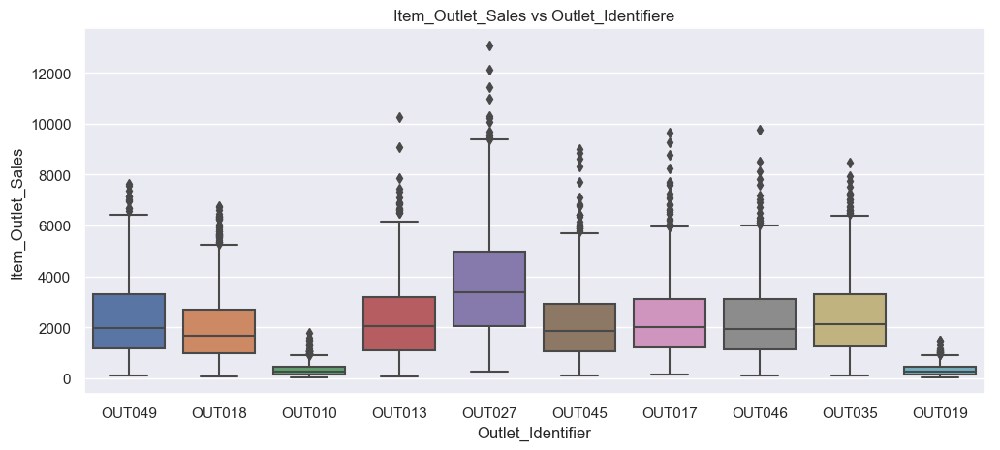

In [1329]:
sns.set(rc={'figure.figsize':(12,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Outlet_Identifier', data=df);
plt.title('Item_Outlet_Sales vs Outlet_Identifiere');

-  Outlet 'OUT010' and 'OUT019' have most of their data points around the lower sales values as compared to the other outlets.
-  Outlet 'OUT027' has better sales compared to other outlets.

## 11. Item_Outlet_Sales vs Outlet_Size
    Relation between sales of product in particular store and size of the outlet.

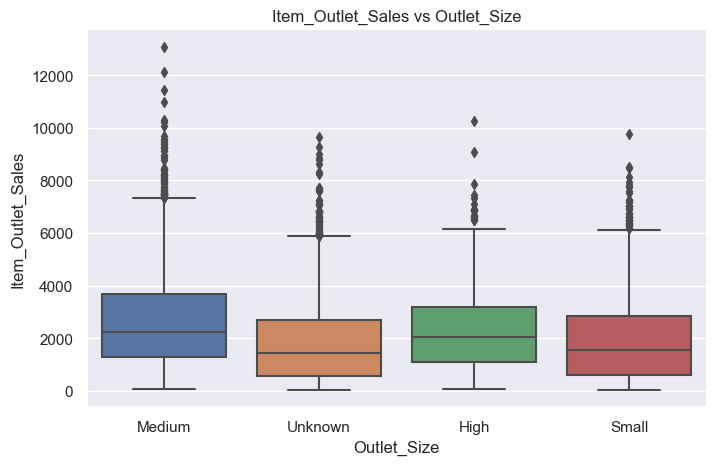

In [1330]:
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
sns.boxplot(y='Item_Outlet_Sales', x='Outlet_Size', data=df);
plt.title('Item_Outlet_Sales vs Outlet_Size');

- Outlet_Size medium have more sales overall.
- Distribution of Item_Outlet_Sales across the categories of Outlet_Location_Size is not very distinct.

## 12. Outlet_Location_Type vs Outlet_Size
    Relation between type of city in which the store is located and size of the outlet.

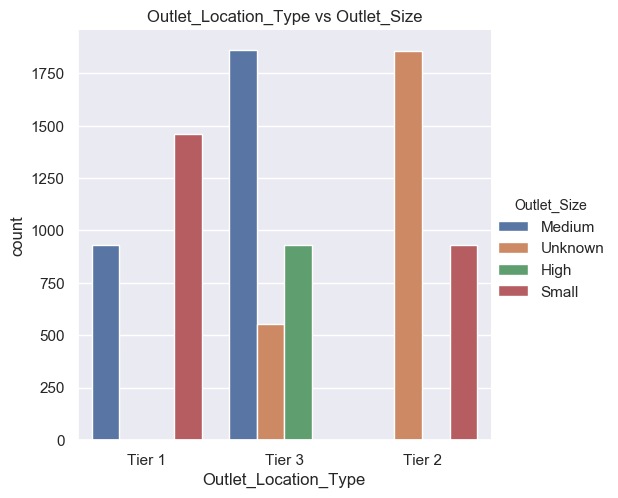

In [1331]:
sns.set(rc={'figure.figsize':(8,5), 'figure.dpi':100})
sns.factorplot('Outlet_Location_Type',data = df,hue ='Outlet_Size' ,kind='count');
plt.title('Outlet_Location_Type vs Outlet_Size');

- There are High size and no small outlets in City of type Tier3 only.
- City type Tier2 only have small outlets, while city of type Tier1 have medium and small outlets.


# <u>Multivariate analysis</u>
        Multivariate analysis is based on the statistical principle of multivariate statistics, which involves observation and analysis of more than one statistical outcome variable at a time.
    

## Pair plots
    comparing two continuos and one categorical variable.

<Figure size 800x500 with 0 Axes>

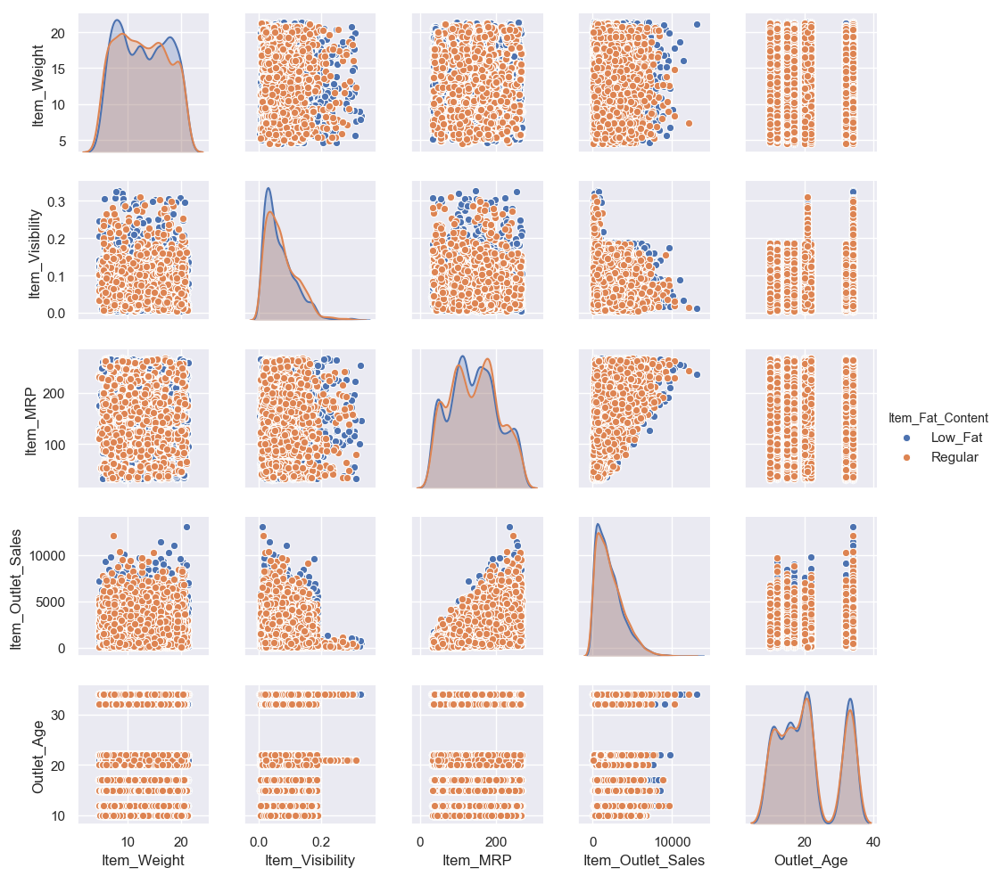

<Figure size 800x500 with 0 Axes>

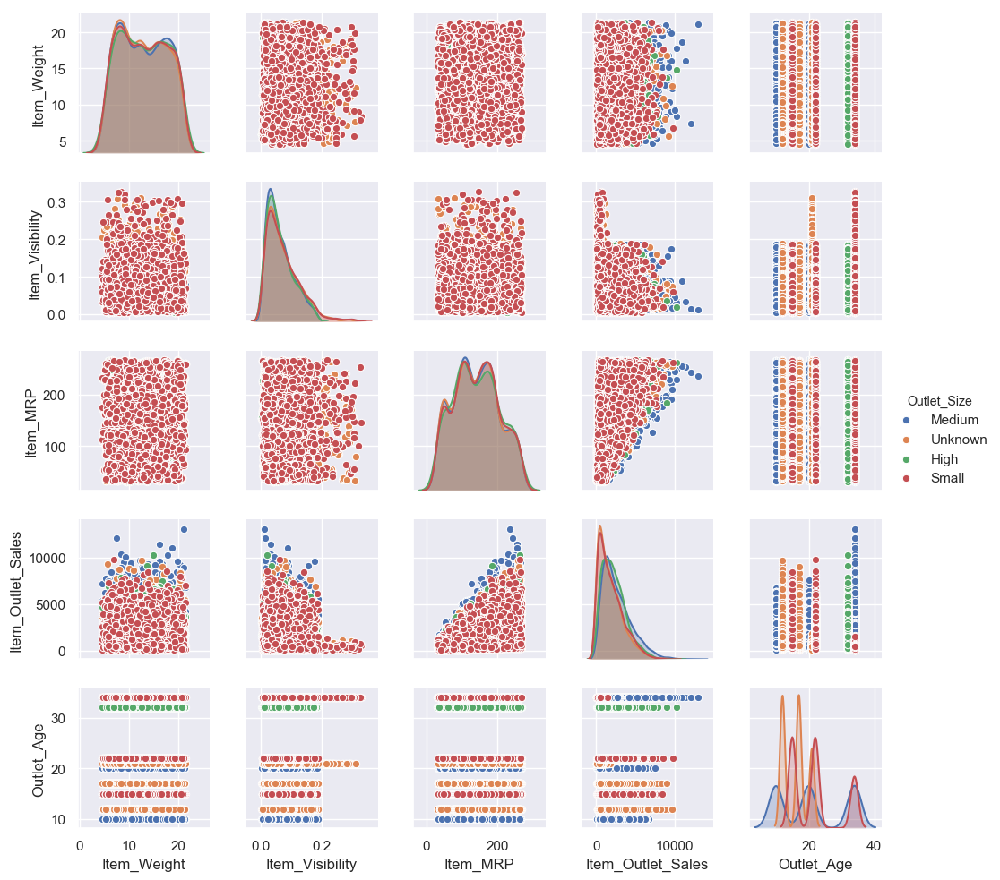

<Figure size 800x500 with 0 Axes>

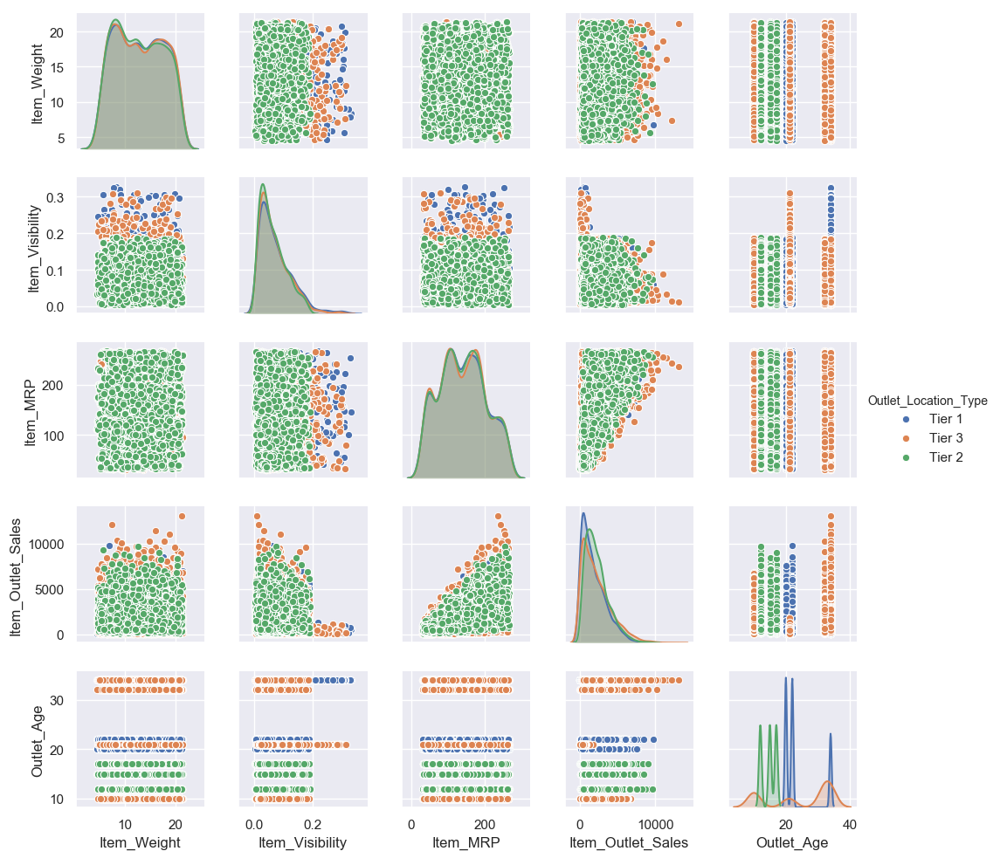

<Figure size 800x500 with 0 Axes>

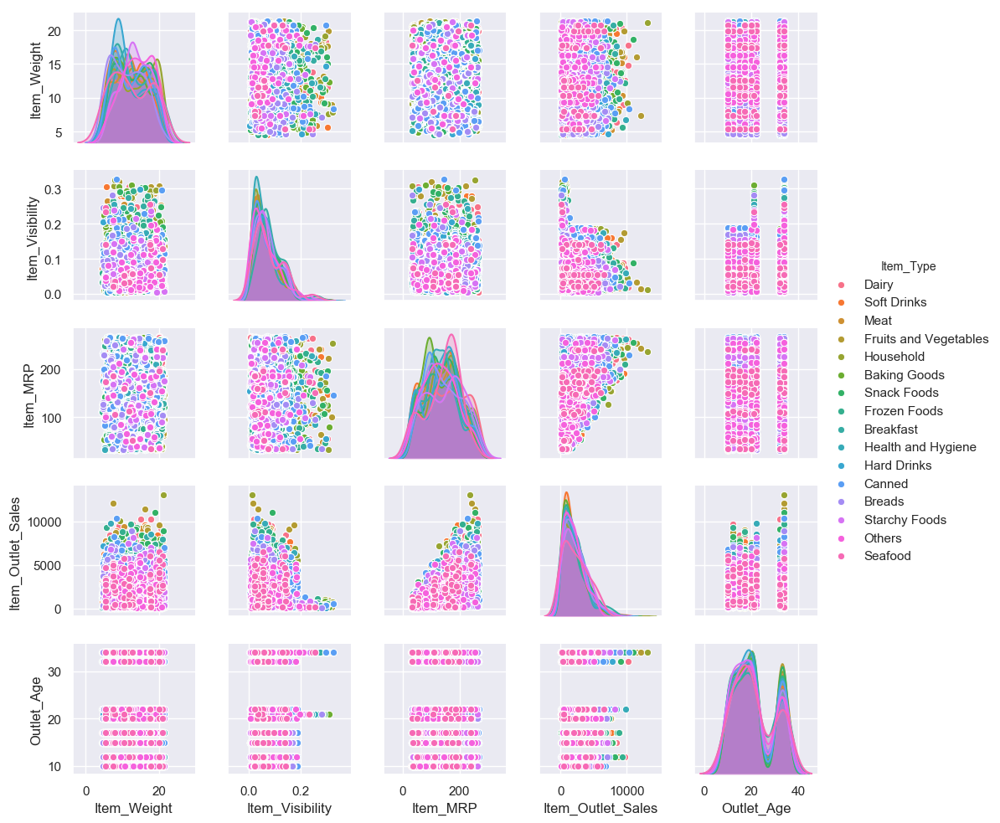

<Figure size 800x500 with 0 Axes>

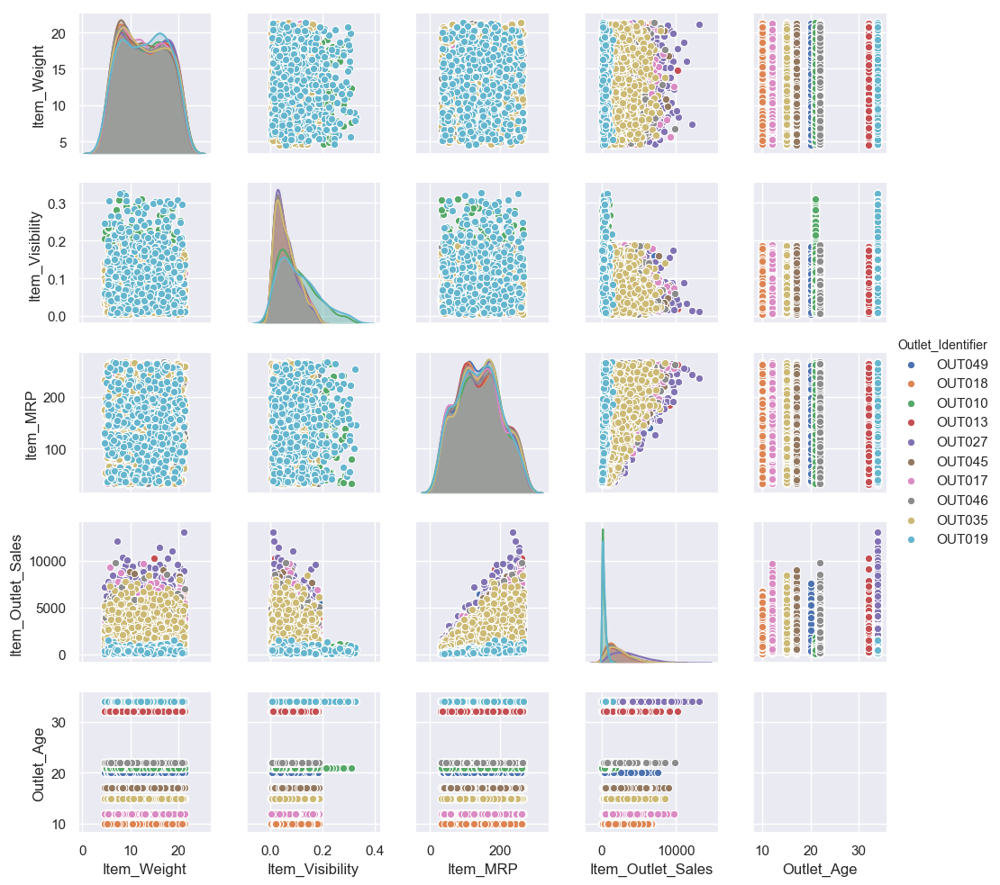

<Figure size 800x500 with 0 Axes>

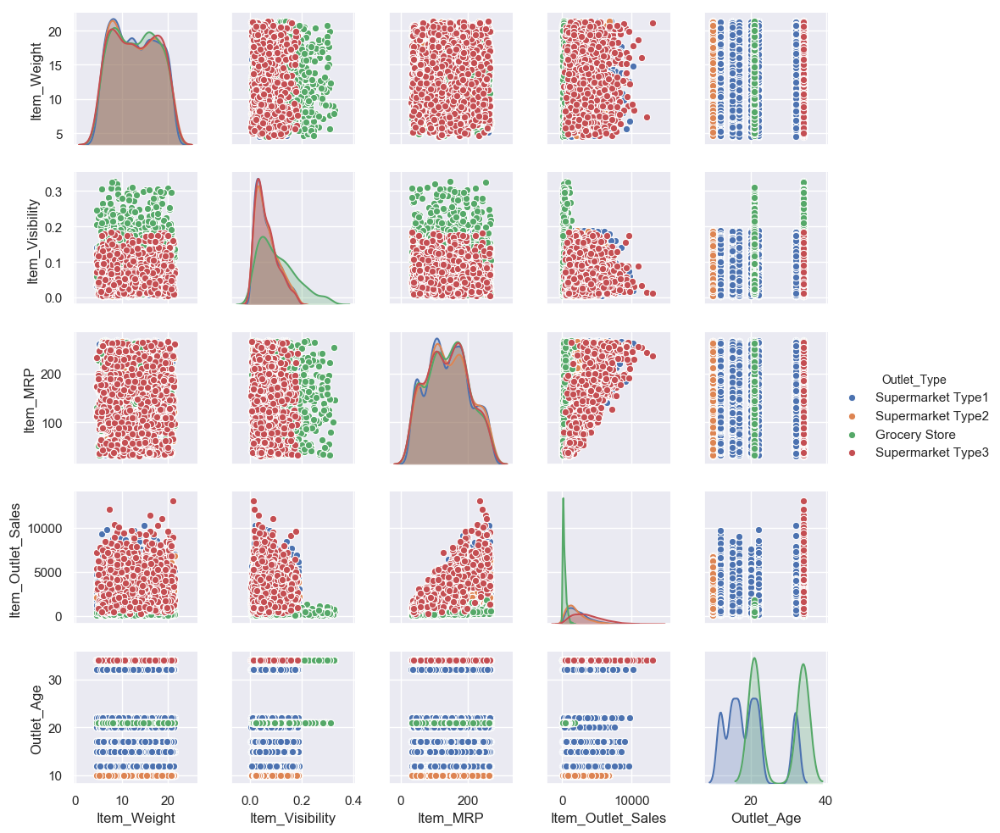

In [1332]:
#categorical columns 
cat_col = ['Item_Fat_Content','Outlet_Size','Outlet_Location_Type','Item_Type',
           'Outlet_Identifier', 'Outlet_Type']

#plot for each categorical columns
for col in cat_col:
    sns.set()
    plt.figure()
    sns.pairplot(df,size=2.0,hue=col);
    plt.show()


## 1. Item_Sales_Outlet, Outlet_Type and Item_Fat_Content

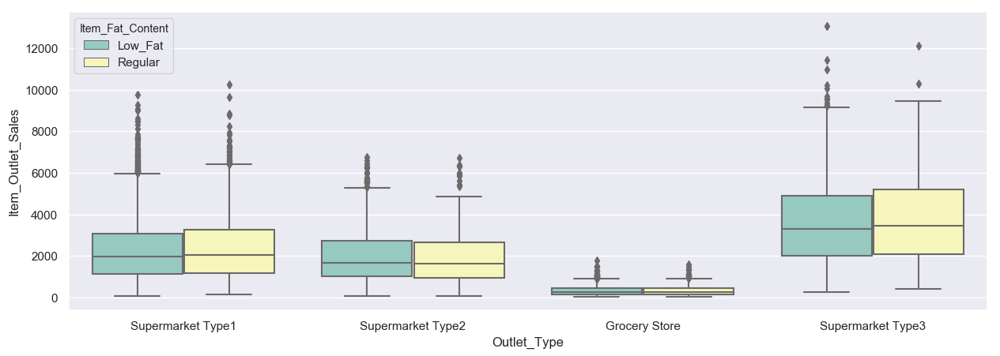

In [1333]:
sns.set(rc={'figure.figsize':(15,5), 'figure.dpi':100})
sns.boxplot(hue="Item_Fat_Content", y="Item_Outlet_Sales", x="Outlet_Type", data=df, palette="Set3");

-  Supermarket type3 has more sale of both low fat and regular fat items compare to other types of outlets.
-  Grocery store has least sale of both low fat and regular fat items.

## 2. Item_Outlet_Sales, Outlet_Type and Outlet_Location_Type

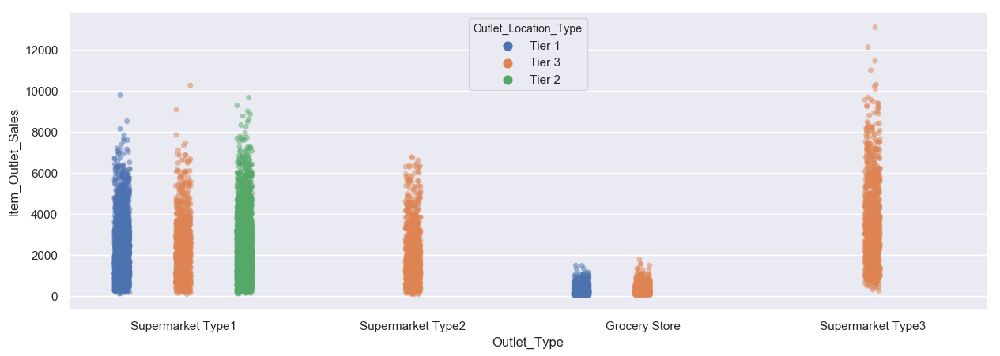

In [1334]:
sns.stripplot(y=df['Item_Outlet_Sales'], x=df['Outlet_Type'], hue=df['Outlet_Location_Type']
              , alpha=0.5, jitter=True, dodge=True);

- Supermarker type1 are equal in number in all outlet location types, and more in number compared to others outlet types.
- Grocery stores are least in number, present in tier1 and tier3.

## 3. Item_Outlet_Sales, Outlet_Identifier and Item_Type

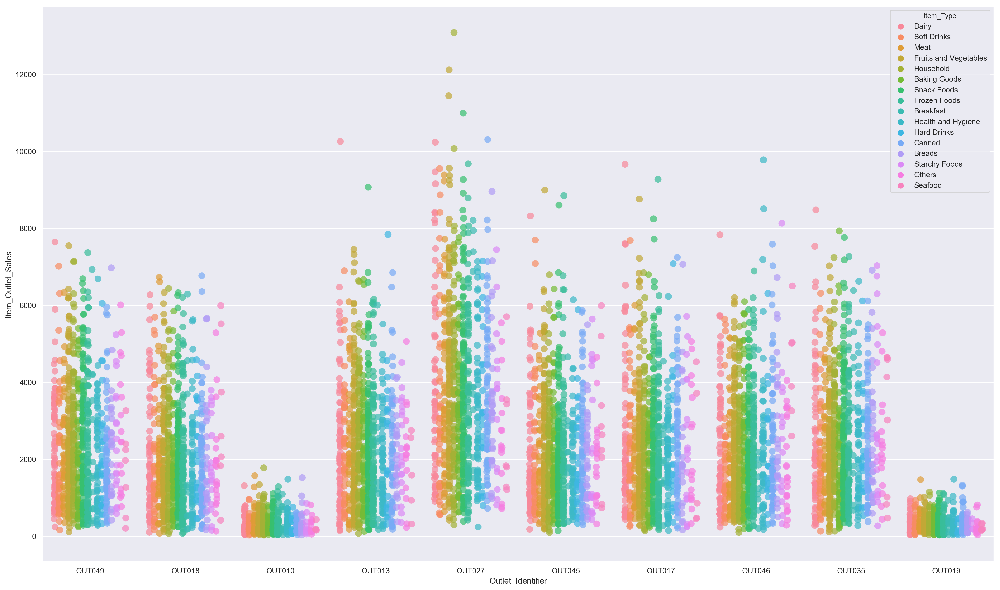

In [1335]:
sns.set(rc={'figure.figsize':(25,15), 'figure.dpi':200})
sns.stripplot(y=df['Item_Outlet_Sales'], x=df['Outlet_Identifier'],
              hue=df['Item_Type'], dodge=True, size=10, jitter=True, alpha=0.7);

- OUT027 has more sales of all item types
- OUT010 and OUT019 have lesser compared to all other.

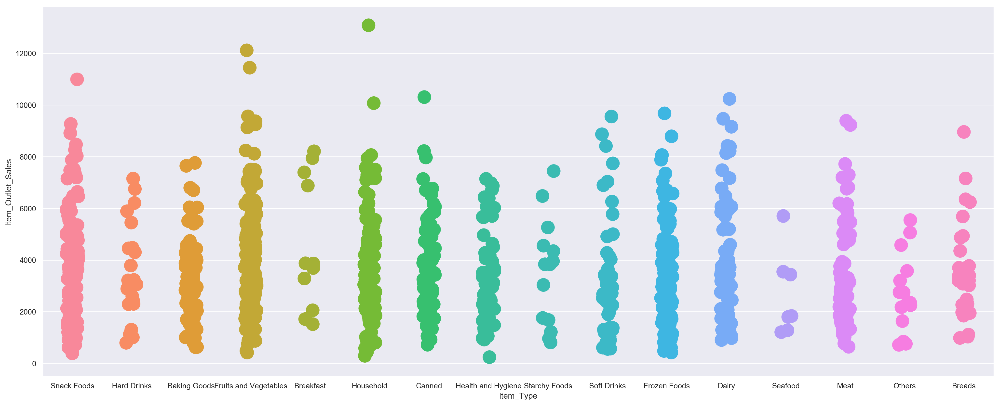

In [1336]:
sns.set(rc={'figure.figsize':(25,10), 'figure.dpi':200})
df_out027 = df[df.Outlet_Identifier=='OUT027'].copy()
sns.stripplot(y='Item_Outlet_Sales',
              x='Item_Type', dodge=True, size=20, data=df_out027);

- Sale of each type in Outlet OUT027, all having almost equal sales except some outliers in houseshold.

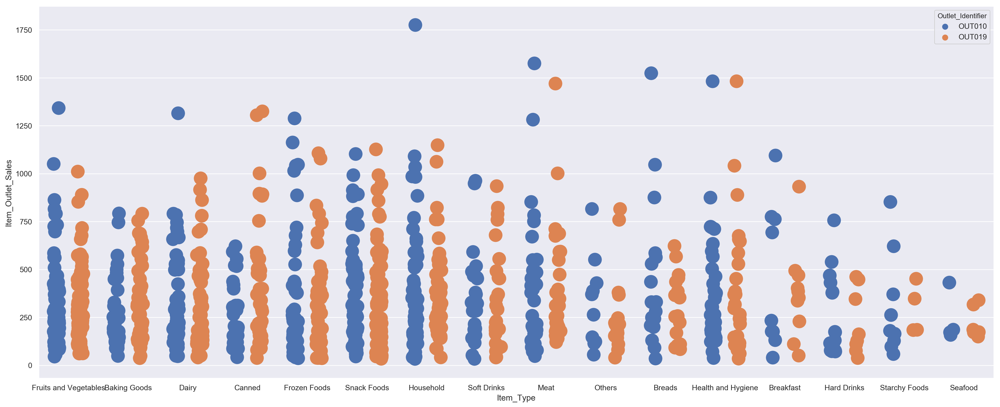

In [1337]:
df_low = df[(df.Outlet_Identifier =='OUT010') | (df.Outlet_Identifier=='OUT019')].copy()
sns.stripplot(y='Item_Outlet_Sales', hue='Outlet_Identifier',
              x='Item_Type', dodge=True, size=20, data=df_low);

- Sale of each item type in outlet OUT010 and OUT019, having less sale of seafood and starchy foods.

# Sales of  product at each store

In [1338]:
item_sales = df.pivot_table(index='Item_Identifier', values='Item_Outlet_Sales', columns='Outlet_Identifier')
item_sales.head()

Outlet_Identifier,OUT010,OUT013,OUT017,OUT018,OUT019,OUT027,OUT035,OUT045,OUT046,OUT049
Item_Identifier,,,,,,,,,,
DRA12,283.6308,2552.6772,2552.6772,850.8924,NaN,NaN,992.7078,3829.0158,NaN,NaN
DRA24,327.5736,4422.2436,1146.5076,NaN,491.3604,4913.6040,3439.5228,NaN,NaN,982.7208
DRA59,185.0924,555.2772,2406.2012,4442.2176,555.2772,7033.5112,NaN,NaN,4442.2176,1295.6468
DRB01,NaN,2466.7890,NaN,NaN,NaN,569.2590,NaN,NaN,NaN,1518.0240
DRB13,948.7650,3605.3070,3415.5540,NaN,NaN,NaN,569.2590,NaN,NaN,3605.3070


Pivot table for sales of each product at particular store.

## Items with highest sales for each outlets with their total sales.

### Items which have maximum sales at each outlet

In [1339]:
print('Item\t Outlet\t\tTotal Sales\n')
max_sale_item = []
for i in item_sales.columns:
    data = item_sales.loc[item_sales[i]==item_sales[i].max(),[i]]
    max_sale_item.append(data.index[0])
    print(data.index[0],"\t",data.columns[0],"\t%.2f"%data[i][0])


Item	 Outlet		Total Sales

NCK30 	 OUT010 	1775.69
FDF39 	 OUT013 	10256.65
FDK03 	 OUT017 	9664.75
FDC02 	 OUT018 	6768.52
NCX41 	 OUT019 	1482.07
NCE42 	 OUT027 	13086.96
FDI15 	 OUT035 	8479.63
FDY55 	 OUT045 	8994.96
NCM05 	 OUT046 	9779.94
FDB15 	 OUT049 	7646.05


#### Finding sale of above maximum selling items sales at each store

In [1340]:
item_sales.loc[max_sale_item]

Outlet_Identifier,OUT010,OUT013,OUT017,OUT018,OUT019,OUT027,OUT035,OUT045,OUT046,OUT049
Item_Identifier,,,,,,,,,,
NCK30,1775.6886,4819.7262,NaN,2283.0282,NaN,NaN,4566.0564,2283.0282,NaN,NaN
FDF39,NaN,10256.6490,NaN,2366.9190,NaN,NaN,NaN,4207.8560,4996.8290,NaN
FDK03,254.3356,NaN,9664.7528,4832.3764,NaN,8138.7392,NaN,4578.0408,2797.6916,4578.0408
FDC02,520.6556,3644.5892,NaN,6768.5228,NaN,4165.2448,5206.5560,NaN,7028.8506,NaN
NCX41,1482.0708,NaN,NaN,2117.2440,1482.0708,NaN,NaN,2752.4172,3811.0392,2540.6928
NCE42,NaN,3739.1328,NaN,2103.2622,NaN,13086.9648,1869.5664,NaN,3271.7412,NaN
FDI15,NaN,5564.7564,2384.8956,NaN,529.9768,NaN,8479.6288,NaN,3179.8608,3709.8376
FDY55,NaN,7452.9652,NaN,1541.9928,256.9988,9251.9568,4111.9808,8994.9580,4625.9784,6424.9700
NCM05,264.3226,NaN,NaN,NaN,528.6452,6872.3876,4229.1616,NaN,9779.9362,3964.8390


-  Most of the items are making maximum sales at each store almost.

### Items which have minimum sales at each outlet

In [1341]:
print('Item\t Outlet\t\tTotal Sales\n')
min_sale_item = []
for i in item_sales.columns:
    data = item_sales.loc[item_sales[i]==item_sales[i].min(),[i]]
    min_sale_item.append(data.index[0])
    print(data.index[0],"\t",data.columns[0],"\t%.2f"%data[i][0])

Item	 Outlet		Total Sales

DRK12 	 OUT010 	33.29
NCA06 	 OUT013 	73.24
NCI43 	 OUT017 	143.81
NCE31 	 OUT018 	69.24
FDU21 	 OUT019 	33.96
NCU05 	 OUT027 	241.69
FDE32 	 OUT035 	113.85
NCR42 	 OUT045 	99.87
NCO06 	 OUT046 	101.87
FDF09 	 OUT049 	111.85


#### Finding sale of above minimum selling items sales at each store

In [1342]:
item_sales.loc[min_sale_item]

Outlet_Identifier,OUT010,OUT013,OUT017,OUT018,OUT019,OUT027,OUT035,OUT045,OUT046,OUT049
Item_Identifier,,,,,,,,,,
DRK12,33.2900,466.0600,432.7700,366.1900,NaN,898.8300,133.1600,732.3800,NaN,865.5400
NCA06,NaN,73.2380,1061.9510,842.2370,NaN,585.9040,NaN,476.0470,183.0950,768.9990
NCI43,NaN,575.2512,143.8128,575.2512,NaN,1677.8160,1150.5024,NaN,1006.6896,NaN
NCE31,138.4864,450.0808,173.1080,69.2432,NaN,934.7832,NaN,415.4592,727.0536,588.5672
FDU21,NaN,169.7790,577.2486,NaN,33.9558,713.0718,780.9834,543.2928,NaN,373.5138
NCU05,161.1236,NaN,NaN,966.7416,NaN,241.6854,1208.4270,2336.2922,NaN,1288.9888
FDE32,NaN,227.7036,872.8638,265.6542,NaN,1024.6662,113.8518,NaN,834.9132,NaN
NCR42,33.2900,NaN,199.7400,NaN,NaN,NaN,NaN,99.8700,NaN,NaN
NCO06,67.9116,305.6022,NaN,441.4254,NaN,441.4254,713.0718,NaN,101.8674,NaN


-  Most of the items are not the minimum selling items at each stores.

#### Item NCE42 making the highest sales out of all

In [1343]:
df[df.Item_Identifier=='NCE42']

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Outlet_Age
4429,NCE42,21.1,Low_Fat,0.010593,Household,234.2958,OUT013,High,Tier 3,Supermarket Type1,3739.1328,32
5726,NCE42,21.1,Low_Fat,0.008469,Household,233.2958,OUT018,Medium,Tier 3,Supermarket Type2,2103.2622,10
7188,NCE42,21.1,Low_Fat,0.010551,Household,234.9958,OUT027,Medium,Tier 3,Supermarket Type3,13086.9648,34
8177,NCE42,21.1,Low_Fat,0.010600,Household,233.9958,OUT035,Small,Tier 2,Supermarket Type1,1869.5664,15
8322,NCE42,21.1,Low_Fat,0.010602,Household,235.3958,OUT046,Small,Tier 1,Supermarket Type1,3271.7412,22


-  Making good sales overall, and maximum sales equal to 13,806 approx at OUT27.

## Item sales percentage

In [1344]:
item_sale_percent = df.pivot_table( index='Item_Identifier', values='Item_Outlet_Sales')
item_sale_percent.sort_values(by='Item_Outlet_Sales', ascending=False).head(10).T

Item_Identifier,FDR45,NCL42,FDU55,FDZ50,DRK23,FDF39,FDD44,FDT16,FDY55,FDG17
Item_Outlet_Sales,6035.31055,5962.017067,5922.45745,5512.824,5464.8864,5457.06325,5453.9007,5414.81824,5332.7251,5314.58205


### Details of 10 highest sales making items

#### Fat content

In [1345]:
df.loc[df.Item_Identifier.isin(item_sale_percent.index[:10]),'Item_Fat_Content'].value_counts()

Regular    33
Low_Fat    23
Name: Item_Fat_Content, dtype: int64

- Regular fat content type has higher sales amount of sales.

#### Item Type

In [1346]:
df.loc[df.Item_Identifier.isin(item_sale_percent.index[:10]),'Item_Type'].value_counts()

Soft Drinks    56
Name: Item_Type, dtype: int64

- Highest sales making item type is soft drinks.

#### Outlet type

In [1347]:
df.loc[df.Item_Identifier.isin(item_sale_percent.index[:10]),'Outlet_Type'].value_counts()

Supermarket Type1    38
Grocery Store         8
Supermarket Type3     6
Supermarket Type2     4
Name: Outlet_Type, dtype: int64

- Supermarket type1 have highest sales amount.


<h5 style="text-align:right"><font color = blue>pranjulgupta0203</font><font color = red>@gmail.com</font></h5>